## Amirhossein Bagheri 98105621
## Mohammad Sadegh majidi Yazdi  98106004
## Amirmahdi kousheshi 98171053


# data preprocess
in the preprocess file which name is pre_process.ipynb
we ran the preprocess part and result is cs.csv

#### note that for labels our dataset was multi label for each item and here is how we reduced it to 1 label for each item

+ we could use most frequent label for each item but we chosed more challenging method that we used least frequent label for reducing multi label to one label.


### make sure you have ran preprocess.ipynb if you want to rerun notebook.
you need to have arxiv_data_210930-054931.csv.zip put in DATA folder
then run preprocess.ipynb then in ./DATA/Module_data folder you will find cs.csv
and copy next to this notebook. 

In [ ]:
pip install matplotlib==3.1.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.1.1-cp37-cp37m-manylinux1_x86_64.whl (13.1 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.5.2
    Uninstalling matplotlib-3.5.2:
      Successfully uninstalled matplotlib-3.5.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pretty-confusion-matrix 0.1.1 requires matplotlib<4.0.0,>=3.5.0, but you have matplotlib 3.1.1 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
pip install -U sentence-transformers


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 79 kB 3.9 MB/s 
     |████████████████████████████████| 4.2 MB 10.6 MB/s 
     |████████████████████████████████| 1.2 MB 55.1 MB/s 
     |████████████████████████████████| 86 kB 6.2 MB/s 
     |████████████████████████████████| 6.6 MB 55.3 MB/s 
     |████████████████████████████████| 596 kB 68.1 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.0-py3-none-any.whl size=120747 sha256=98a8a32f6165d6ee1a55cdbdb61fda298fdbcc36521d528872a1e043221b7172
  Stored in directory: /root/.cache/pip/wheels/83/c0/df/b6873ab7aac3f2465aa9144b6b4c41c4391cfecc027c8b07e7
Successfully built sentence-transformers
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


+ note that matplotlib version is important

In [ ]:
pip install pretty-confusion-matrix

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 199 kB 5.1 MB/s 
     |████████████████████████████████| 11.2 MB 52.4 MB/s 
     |████████████████████████████████| 103 kB 47.6 MB/s 
     |████████████████████████████████| 156 kB 72.3 MB/s 
     |████████████████████████████████| 73 kB 2.0 MB/s 
     |████████████████████████████████| 843 kB 61.4 MB/s 
     |████████████████████████████████| 68 kB 8.8 MB/s 
     |████████████████████████████████| 41 kB 472 kB/s 
     |████████████████████████████████| 930 kB 49.6 MB/s 
     |████████████████████████████████| 98 kB 10.7 MB/s 
     |████████████████████████████████| 8.8 MB 55.5 MB/s 
     |████████████████████████████████| 461 kB 55.7 MB/s 
  Attempting uninstall: tomli
    Found existing installation: tomli 2.0.1
    Uninstalling tomli-2.0.1:
      Successfully uninstalled tomli-2.0.1
  Attempting uninstall: matplotlib
    Found existing installati

+ install pretty-confusion-matrix for better evaluation

## I mount my google drive because i run it in colab if you want to run it on your PC you have to run preprocess again and then put cs.csv next to this note book.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/IR/cs.csv ./

In [ ]:
import pandas as pd
import json
import sklearn
from sentence_transformers import SentenceTransformer
import numpy as np
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from sklearn.mixture import GaussianMixture
from collections import Counter
from collections import defaultdict
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import TSNE
from pretty_confusion_matrix import pp_matrix
from pretty_confusion_matrix import pp_matrix_from_data
from sklearn.metrics import *
from sklearn.feature_extraction.text import TfidfVectorizer

## loading models
+ we have to model one that representations vectors are from tf-idf and the other one that they are from bert model


In [ ]:
bert_model = SentenceTransformer("all-MiniLM-L6-v2")
vectorizer_bastract = TfidfVectorizer()
csv_data = pd.read_csv("cs.csv")
flatten = lambda label : [item for l in label for item in l]

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

## loading data and reduce multi labels to single labels

+ as i said we chose more challenging part if you look at labels occurrence you would fint that here
```py
print(Counter(flatten(label)))
>>>
Counter({0: 10925, 1: 7903, 2: 6171, 3: 1546, 4: 1112})
```
this means that for multi label items if we choose max we are choosing lower repeated label.
here is result then
```py
reduced_labeling = [max(l) for l in label]
count = Counter(reduced_labeling)
>>>
Counter({2: 5470, 1: 4619, 3: 1527, 4: 1112})
```
now every object has one label and 4 labels exist in dataset.





In [ ]:

data_title = [row["titles"] for idx,row in csv_data.iterrows()]
data_abstract = [row["abstracts"] for idx,row in csv_data.iterrows()]
label =  [list(map(int,row["terms"].replace("[","").replace("]","").split(","))) for idx,row in csv_data.iterrows()]
print(Counter(flatten(label)))
reduced_labeling = [max(l) for l in label]
count = Counter(reduced_labeling)
N_COMPONENT = 3*len(count)
# sorted_c = sorted([item for item in count.items()],key = lambda x : x[1] , reversed = True)
print(count)
reduced_labeling = np.array(reduced_labeling)

Counter({0: 10925, 1: 7903, 2: 6171, 3: 1546, 4: 1112})
Counter({2: 5470, 1: 4619, 3: 1527, 4: 1112})


## plot functions and mapping
two funtion 
```py
def show_data(data,y,title)
def show3D(X,predicted_label,title)
```
are for ploting data in 2d and 3d
+ for every clustring part here we would choose label for each cluster by most repeated orginal label in that cluster. function bellow take and array of predicted label by clustering and map each label to original label in data set by measure of most repeated label in each cluster.
```py
def find_mapping_for_cluster(pre):
  map = defaultdict(lambda : [0 for i in range(N_COMPONENT + 2)])
  for i in range(len(pre)):
    map[pre[i]][reduced_labeling[i]] += 1
  return {k : np.argmax(map[k]) for k in map}
```


In [ ]:
def show_data(data,y,title):
    arr = np.concatenate((data,y),axis= 1)
    df = pd.DataFrame(data = arr, 
                  index = range(len(y)), 
                  columns = ["X","Y","label"])
    fig  = plt.figure(figsize=(18,12))
    cmap = sns.color_palette("bright", len(Counter(y.reshape(-1)))).as_hex()
    sns.scatterplot(data=df, x="X", y="Y", hue="label" ,legend='full',palette = cmap)
    plt.title(title)
    plt.show()
def show3D(X,predicted_label,title):
  x = X[0]
  y = X[1]
  z = X[2]
  label = predicted_label
  fig  = plt.figure(figsize=(18,12))
  ax = fig.gca(projection='3d')
  cmap = ListedColormap(sns.color_palette("bright", len(Counter(predicted_label))).as_hex())
  sc = ax.scatter(x, y, z, s=20, c=label, marker='o', cmap=cmap, alpha=1)
  plt.legend(*sc.legend_elements(), bbox_to_anchor=(1, 1), loc=2)
  plt.title(title)
  plt.show()
def find_mapping_for_cluster(pre):
  map = defaultdict(lambda : [0 for i in range(N_COMPONENT + 2)])
  for i in range(len(pre)):
    map[pre[i]][reduced_labeling[i]] += 1
  return {k : np.argmax(map[k]) for k in map}


## convert text data to vector embedding for both bert and tf-idf
here we convert text data to vectors for both tf-idf and bert
for bert we concat title vector and abstract vector 
```py
concated_data_bert = np.array([np.array([abstract_bert[i],titles_bert[i]]).reshape(-1) for i in range((abstract_bert.shape[0]))])

```
and for tf-idf we have abstract we didn't concat title because it is sparse matrix and convert it to ndarray will cause ram die

In [ ]:
abstract_bert = bert_model.encode(data_abstract,device = "cuda")
titles_bert = bert_model.encode(data_title,device = "cuda")

In [ ]:
tf_idf_data = [data_title[i] + " : " + data_abstract[i] for i in range(len(data_abstract))]
tf_idf_vec = vectorizer_bastract.fit_transform(tf_idf_data)

In [ ]:
concated_data_bert = np.array([np.array([abstract_bert[i],titles_bert[i]]).reshape(-1) for i in range((abstract_bert.shape[0]))])

## 2D AND 3D PCA for actual data and original labels




### PCA for bert embedding

In [ ]:
pca = PCA(n_components=3)
pca.fit(concated_data_bert)
X_3d_bert = pca.transform(concated_data_bert)
pca = PCA(n_components=2)
pca.fit(concated_data_bert)
X_2d_bert = pca.transform(concated_data_bert)


### PCA for tf-idf embedding 
+ note that tf-idf are sparse matrix so we had to use TruncatedSVD

In [ ]:
from sklearn.decomposition import TruncatedSVD
clf = TruncatedSVD(3)
X_3d_tf = clf.fit_transform(tf_idf_vec)
clf = TruncatedSVD(2)
X_2d_tf = clf.fit_transform(tf_idf_vec)

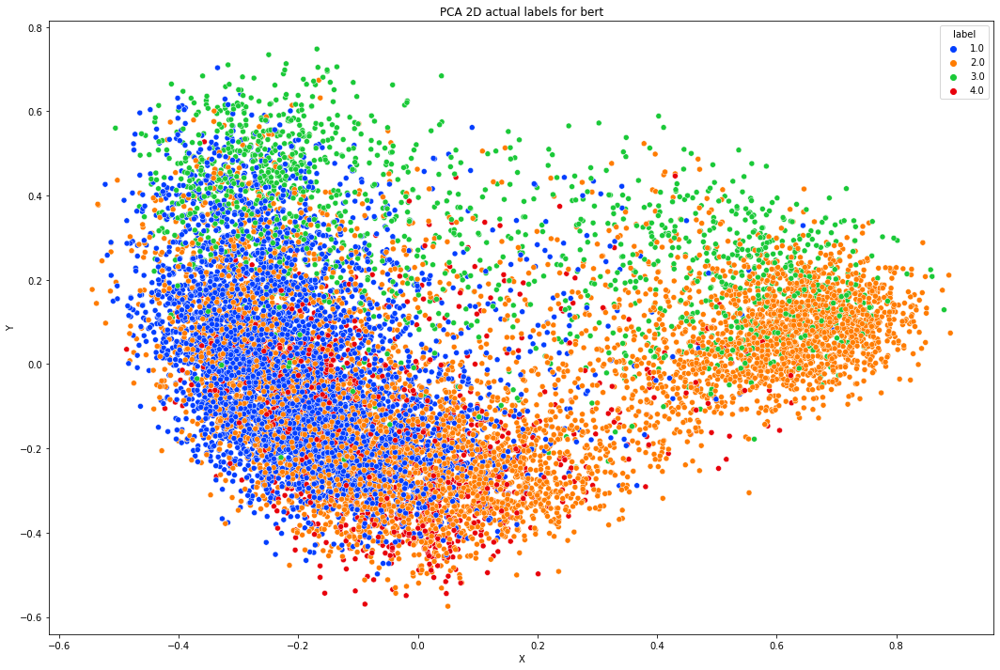

In [ ]:
show_data(X_2d_bert,reduced_labeling.reshape(-1,1),"PCA 2D actual labels for bert")

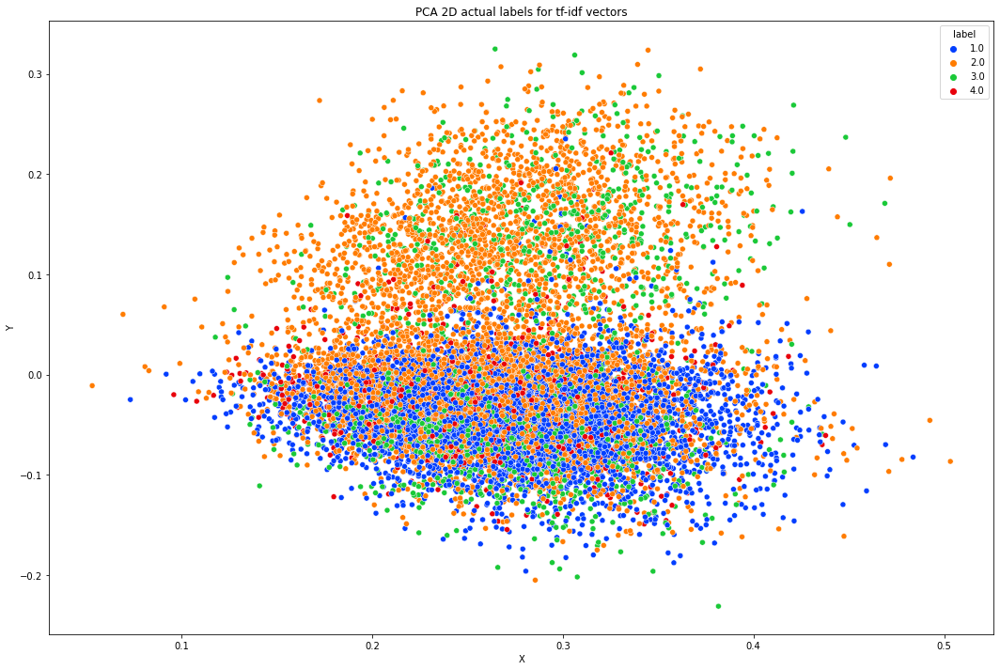

In [ ]:
show_data(X_2d_tf,reduced_labeling.reshape(-1,1),"PCA 2D actual labels for tf-idf vectors")

<b> you can see above that bert embedding is better than tf-idf because it is more separable (atleast seems more separable) in 2D space </b>


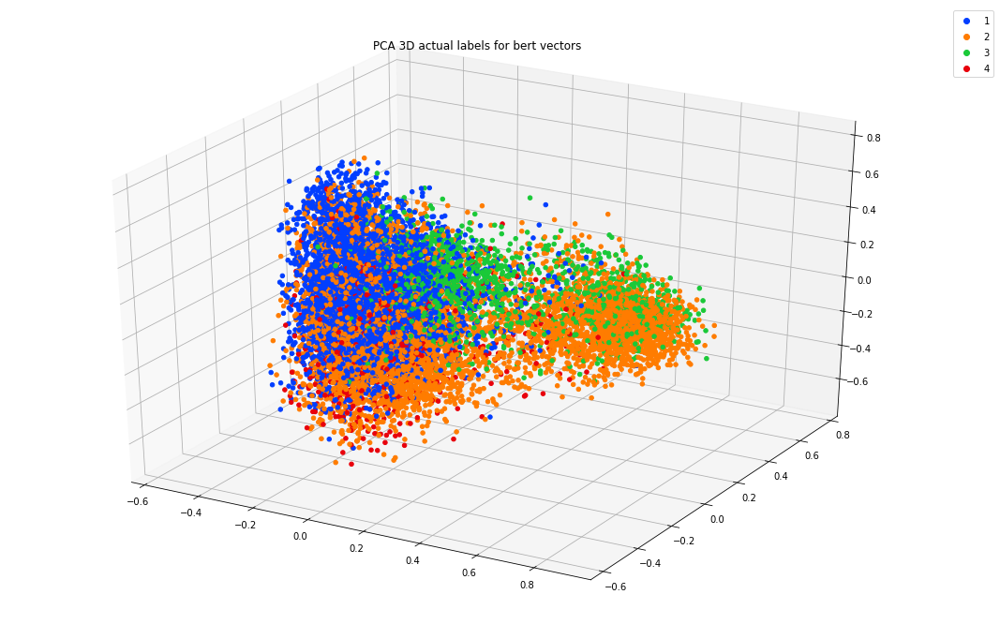

In [ ]:
show3D(X_3d_bert.T,reduced_labeling,"PCA 3D actual labels for bert vectors")

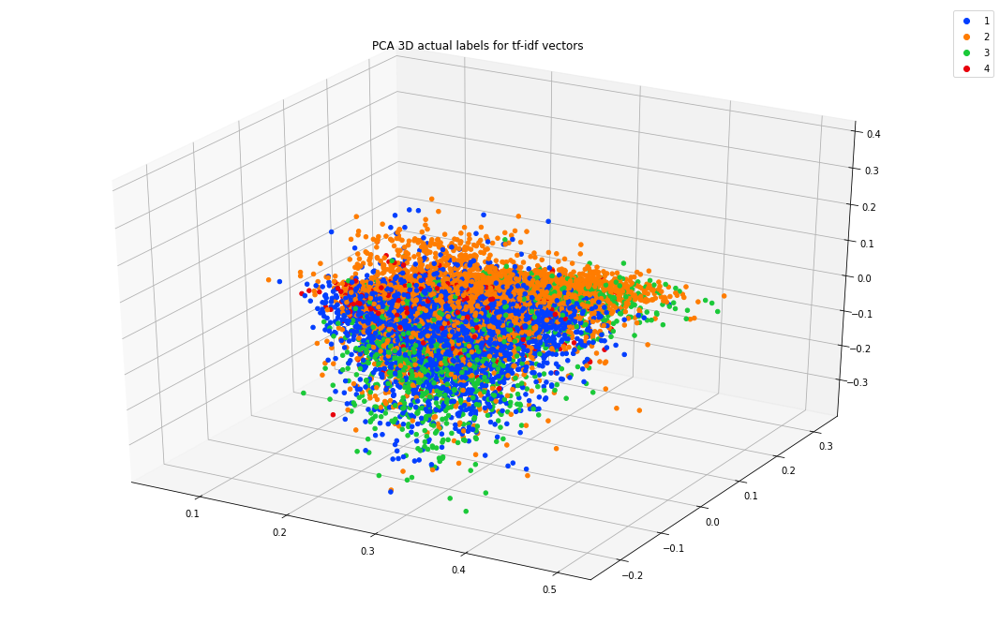

In [ ]:
show3D(X_3d_tf.T,reduced_labeling,"PCA 3D actual labels for tf-idf vectors")

you can see above that bert embedding is better than tf-idf because it is more separable (atleast seems more separable) in 3D space

## TSNE dimension reduction


In [ ]:
tsne = TSNE(n_components=2, learning_rate='auto',init='random')
tsne_data_set_2_bert = tsne.fit_transform(X = concated_data_bert,y = reduced_labeling)
tsne = TSNE(n_components=2, learning_rate='auto',init='random')
tsne_data_set_2_tf = tsne.fit_transform(X = tf_idf_vec,y = reduced_labeling)

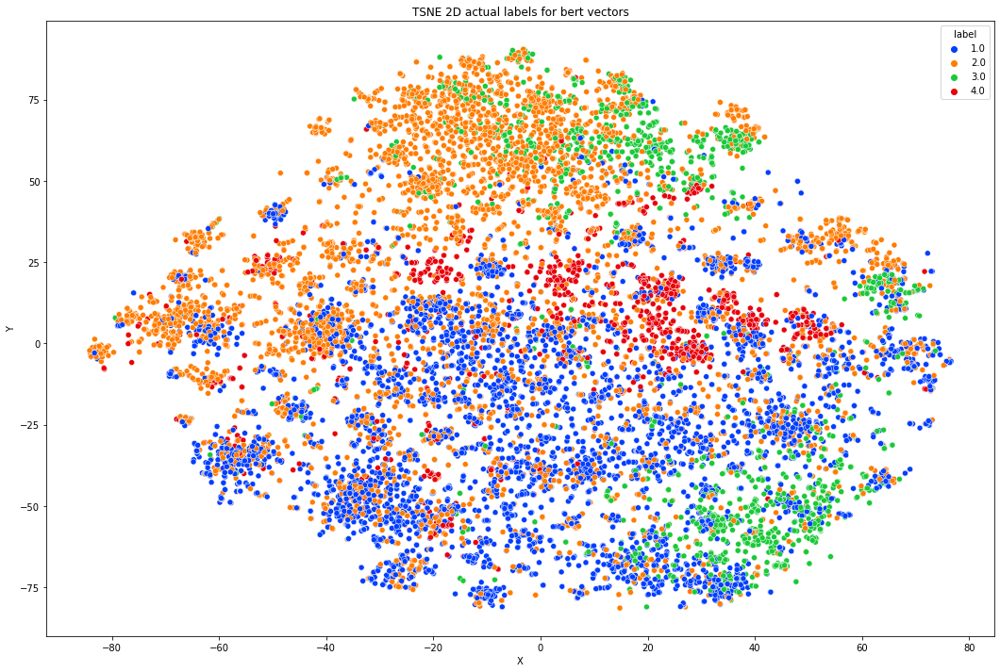

In [ ]:
show_data(tsne_data_set_2_bert,reduced_labeling.reshape(-1,1),"TSNE 2D actual labels for bert vectors")

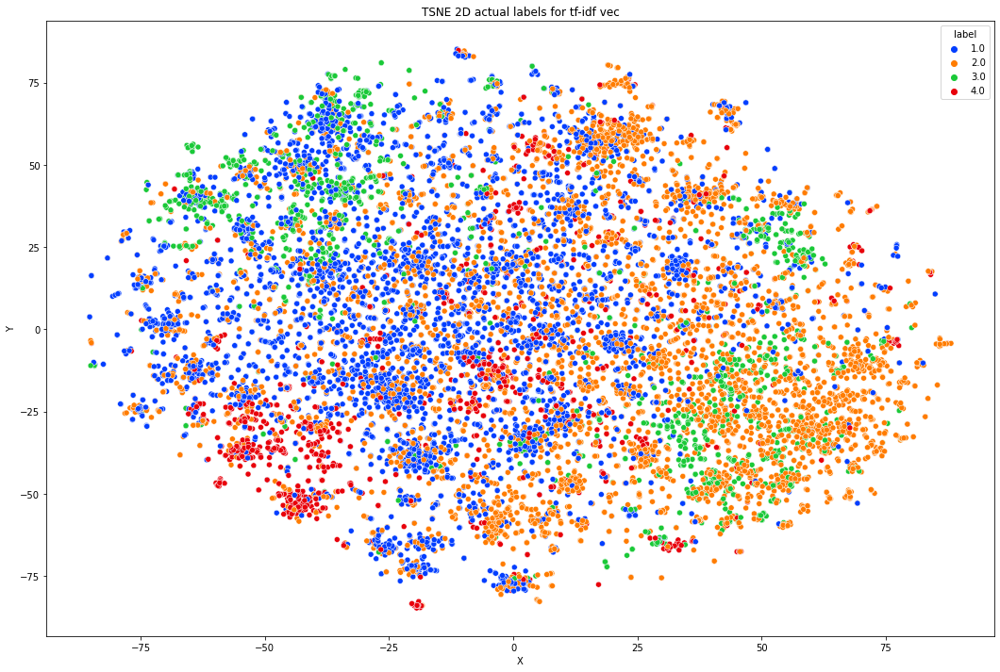

In [ ]:
show_data(tsne_data_set_2_tf,reduced_labeling.reshape(-1,1),"TSNE 2D actual labels for tf-idf vec")

you can  see that bert embedding is better here too.

other thing that we can infer from pictures above is that it seems that probabilistic models with naive approach won't work properly. it will be discussed in classification homework.

## LinearDiscriminantAnalysis
+ one cool linear reduction with regards to labeling

<b> note that this reduction is not applied on tf-idf because it is not working on sparse numpy object. </b>

In [ ]:
clf = LinearDiscriminantAnalysis(n_components=3)
clf.fit(concated_data_bert,reduced_labeling)
X_3d_lda = clf.transform(concated_data_bert)
predicted_label_lda2_bert = clf.predict(concated_data_bert)
clf = LinearDiscriminantAnalysis(n_components=2)
clf.fit(concated_data_bert,reduced_labeling)
X_2d_lda = clf.transform(concated_data_bert)
predicted_label_lda3_bert = clf.predict(concated_data_bert)

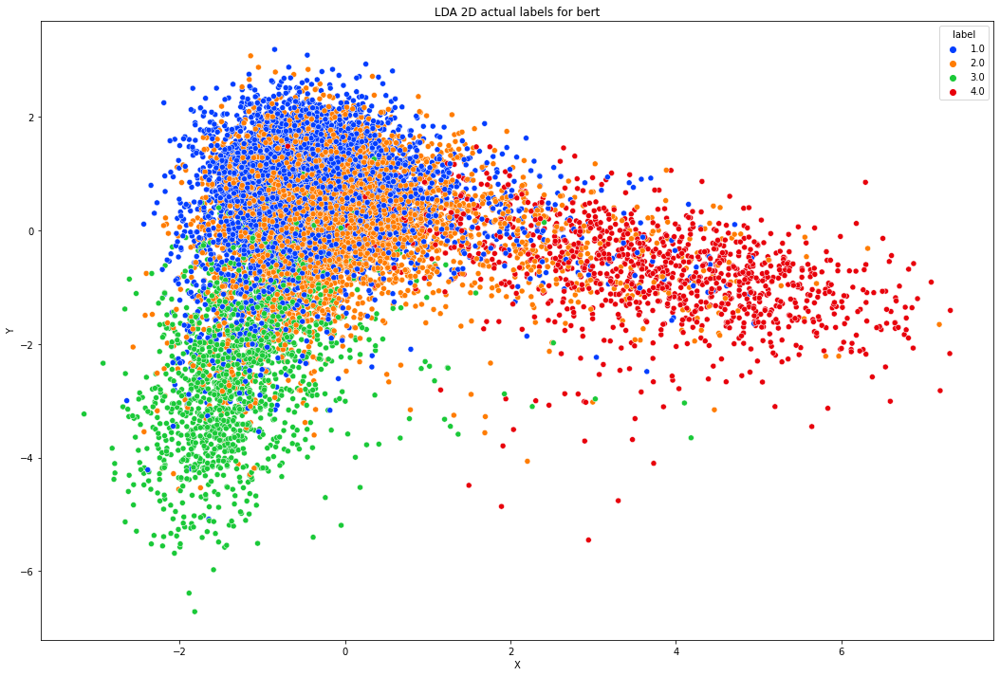

In [ ]:
show_data(X_2d_lda,reduced_labeling.reshape(-1,1),"LDA 2D actual labels for bert")

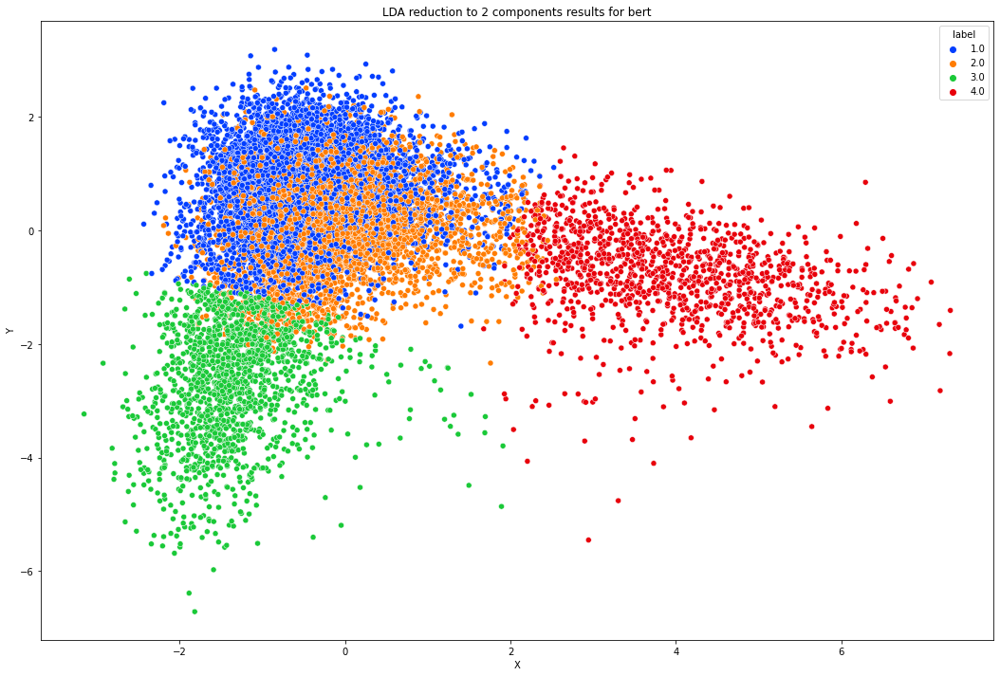

In [ ]:
show_data(X_2d_lda,predicted_label_lda2_bert.reshape(-1,1),"LDA reduction to 2 components results for bert")

this reduction includes labels too

you can see that first picture which is original labels are quit more separable than two prevoius methods.
and second picture is predicted ones which are pretty much same.


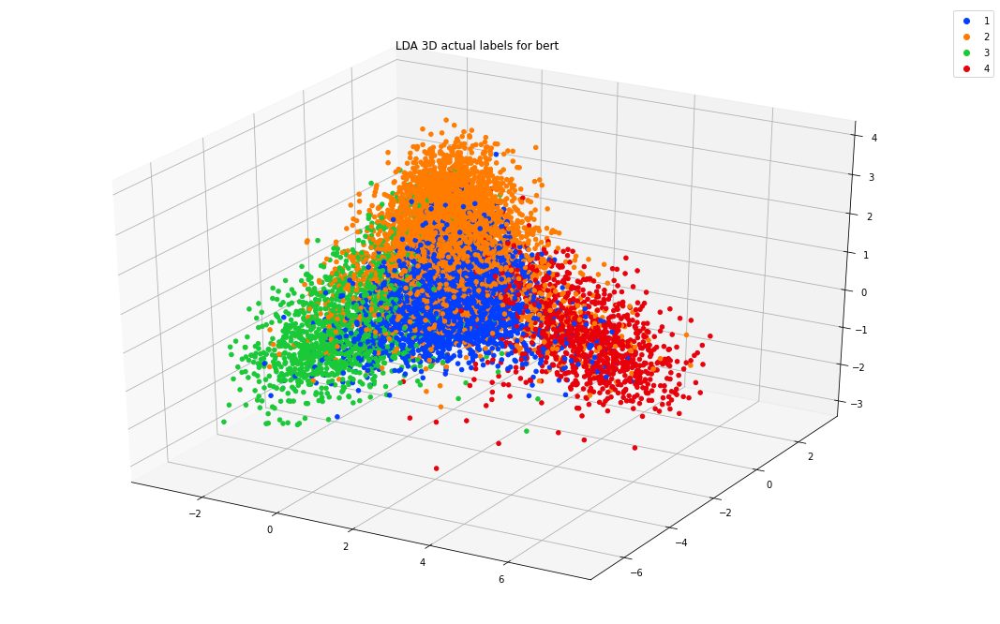

In [ ]:
show3D(X_3d_lda.T,reduced_labeling,"LDA 3D actual labels for bert")

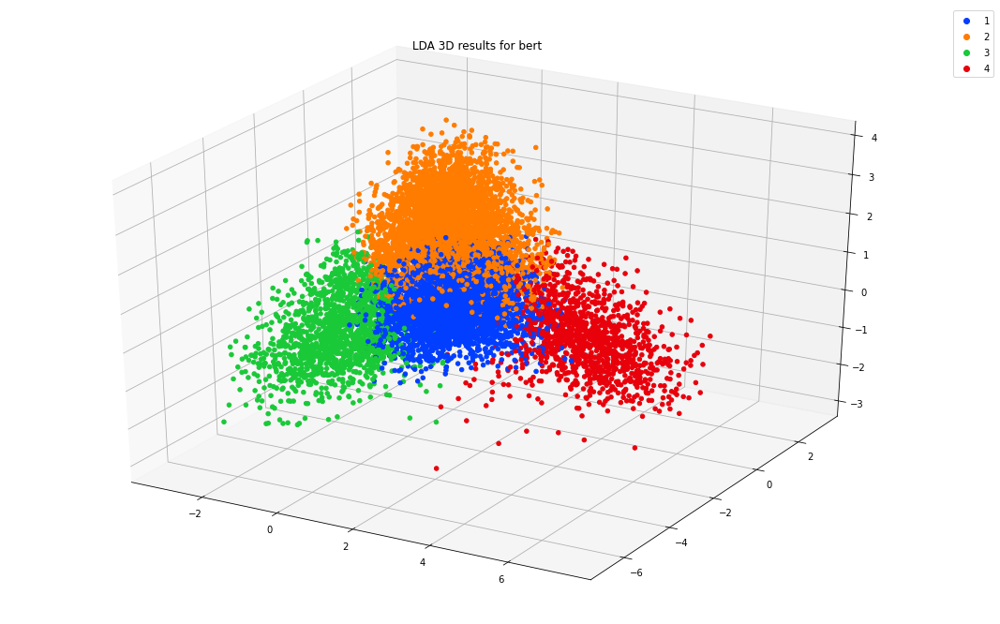

In [ ]:
show3D(X_3d_lda.T,predicted_label_lda3_bert,"LDA 3D results for bert")

this reduction includes labels too

you can see that first picture which is original labels are quit more separable than two prevoius methods.
and second picture is predicted ones which are pretty much same.


# KMEANS

### bert


In [ ]:
km = KMeans(n_clusters= N_COMPONENT, init='k-means++', n_init=10, max_iter=1000, tol=0.0001, verbose=0, random_state=None).fit(concated_data_bert)
predicted_label_kmeans = km.predict(concated_data_bert)
kmeas_map_label = find_mapping_for_cluster(predicted_label_kmeans)

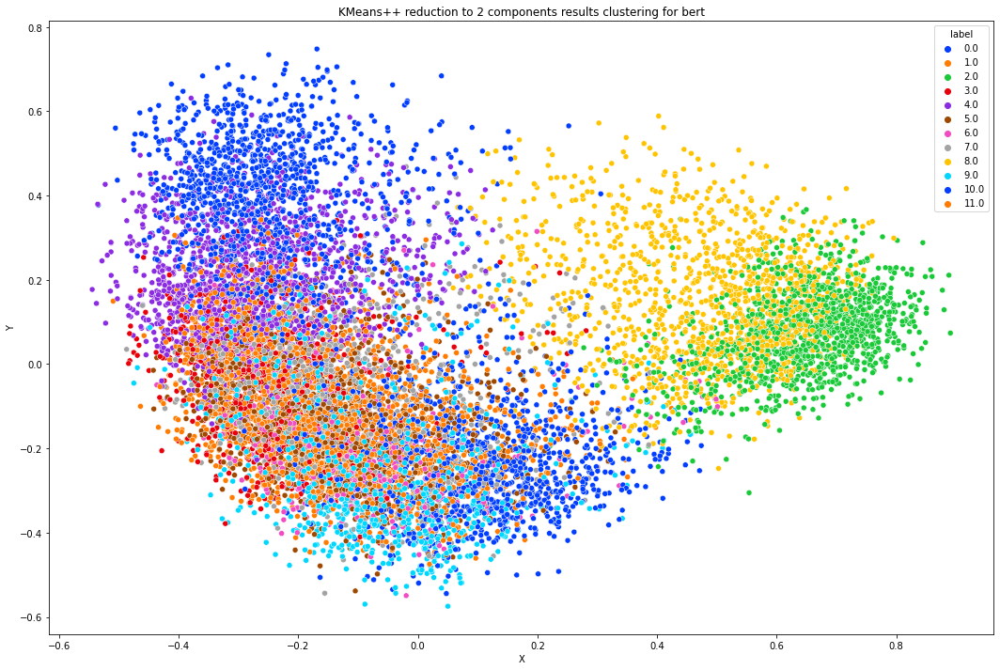

In [ ]:
show_data(X_2d_bert,predicted_label_kmeans.reshape(-1,1),"KMeans++ reduction to 2 components results clustering for bert")

{1: 1, 9: 2, 7: 4, 0: 3, 5: 1, 10: 2, 11: 1, 3: 1, 6: 1, 4: 1, 8: 2, 2: 2}


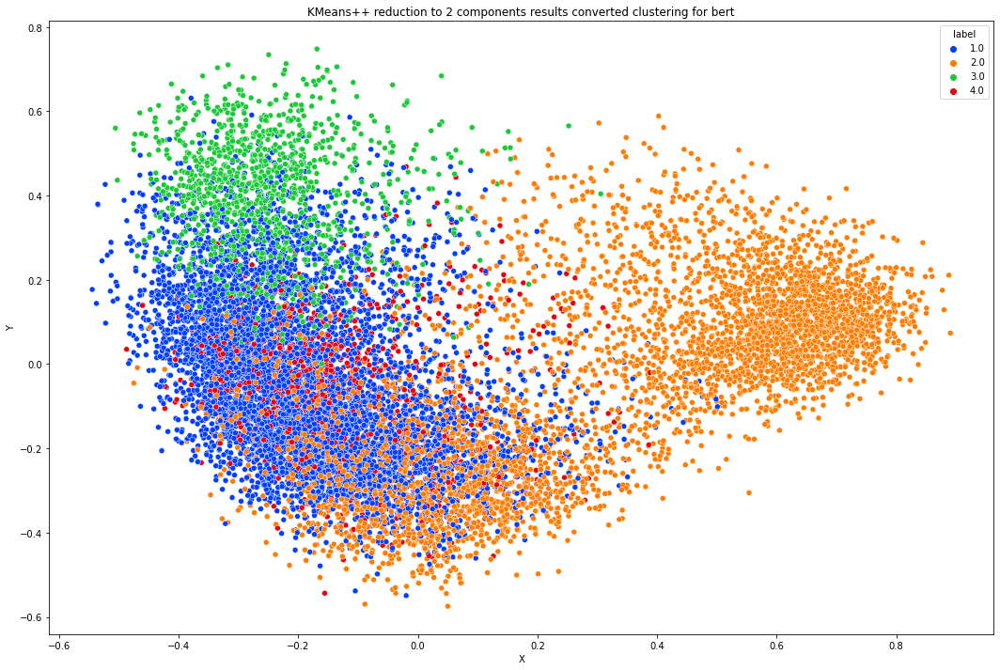

In [ ]:
print(kmeas_map_label)
show_data(X_2d_bert,np.array([kmeas_map_label[i] for i in predicted_label_kmeans]).reshape(-1,1),"KMeans++ reduction to 2 components results converted clustering for bert")

{1: 1, 9: 2, 7: 4, 0: 3, 5: 1, 10: 2, 11: 1, 3: 1, 6: 1, 4: 1, 8: 2, 2: 2}


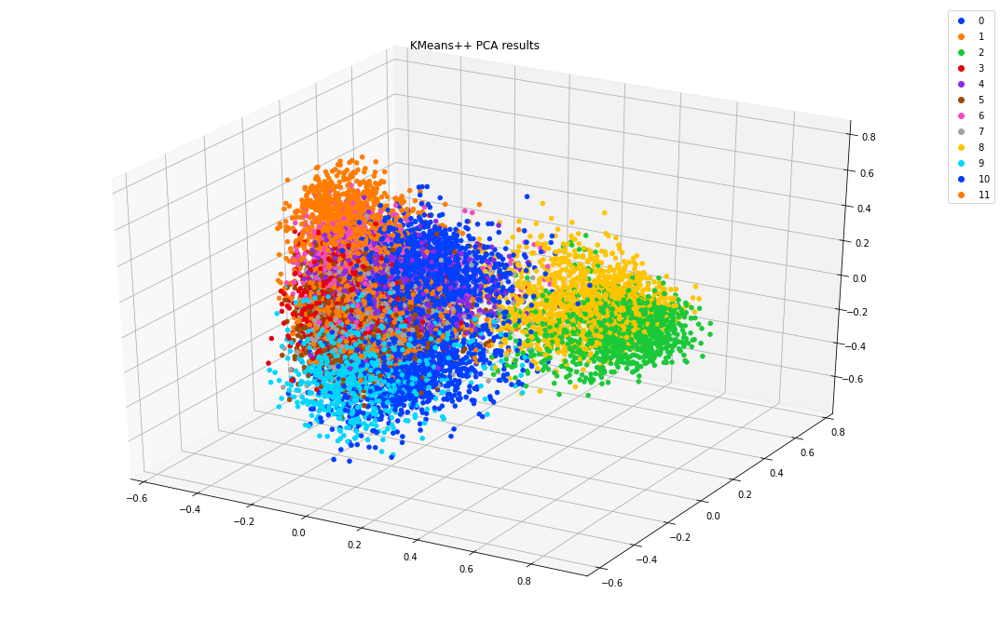

In [ ]:
print(kmeas_map_label)
show3D(X_3d_bert.T,predicted_label_kmeans,"KMeans++ PCA results")

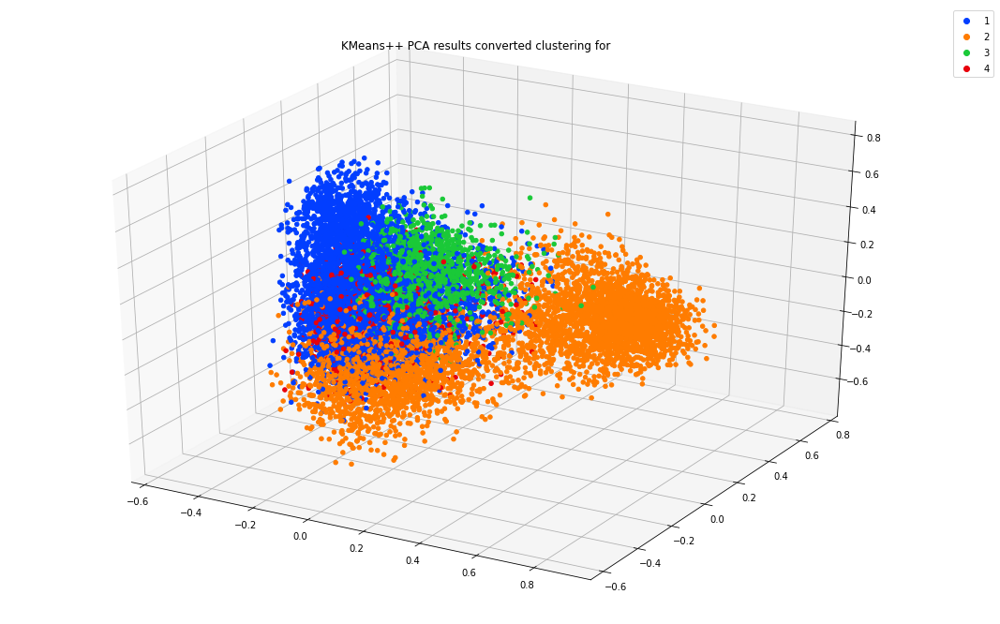

In [ ]:
show3D(X_3d_bert.T,[kmeas_map_label[i] for i in predicted_label_kmeans],"KMeans++ PCA results converted clustering for ")

/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:200: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:201: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:203: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:204: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be remo

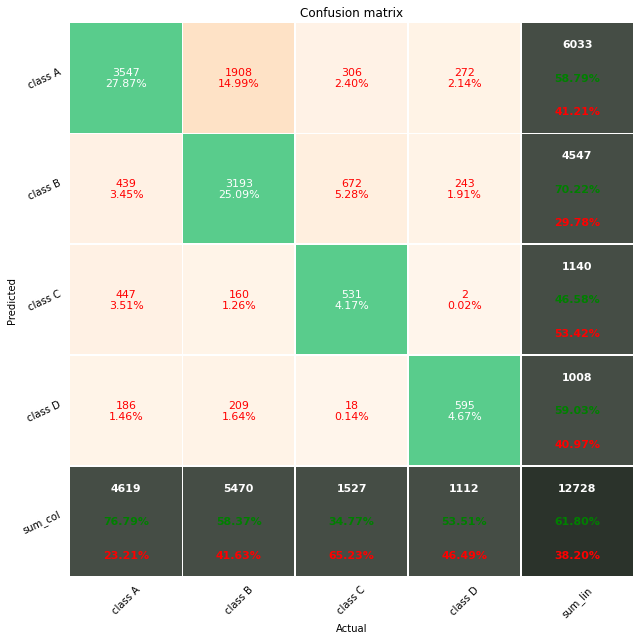

purity is : 0.6180075424261471

rand_score is : 0.6434547239355183

RSS = 16030.236328125
avg RSS = 1.2481074959811564

silhouette_score = 0.027615368366241455

davies_bouldin_score = 4.309355114025574

calinski_harabasz_score = 337.3737069275012


In [ ]:
from sklearn.metrics.cluster import rand_score
y_test = reduced_labeling
predic = np.array([kmeas_map_label[i] for i in predicted_label_kmeans])
matrix = pp_matrix_from_data(y_test, predic)
print(f"purity is : {np.sum(predic == y_test)/len(y_test)}")
print()
print(f"rand_score is : {rand_score(y_test,predic)}")
print()
centers = km.cluster_centers_
RSSs = np.array([np.sum(np.matmul(predicted_label_kmeans == i ,(concated_data_bert - centers[i])**2)) for i in range(len(centers))])
RSSs_mean = np.array([np.sum(np.matmul(predicted_label_kmeans == i ,(concated_data_bert - centers[i])**2))/(predicted_label_kmeans == i).sum() for i in range(len(centers))])
print(f"RSS = {np.sum(RSSs)}")
print(f"avg RSS = {np.sum(RSSs_mean)/len(RSSs_mean)}")
print()
print(f"silhouette_score = {silhouette_score(concated_data_bert,predic)}")
print()
print(f"davies_bouldin_score = {davies_bouldin_score(concated_data_bert,predic)}")
print()
print(f"calinski_harabasz_score = {calinski_harabasz_score(concated_data_bert,predic)}")
# print()
# print(f"r2_score = {r2_score(y_test, predic)}")
# print()
# print(f"adjusted_rand_score = {adjusted_rand_score(y_test, predic)}")


### tf-idf

In [ ]:
km_tf = KMeans(n_clusters= N_COMPONENT, init='k-means++', n_init=10, max_iter=1000, tol=0.0001, verbose=0, random_state=None).fit(tf_idf_vec)
predicted_label_kmeans_tf = km_tf.predict(tf_idf_vec)
kmeas_map_label_tf = find_mapping_for_cluster(predicted_label_kmeans_tf)

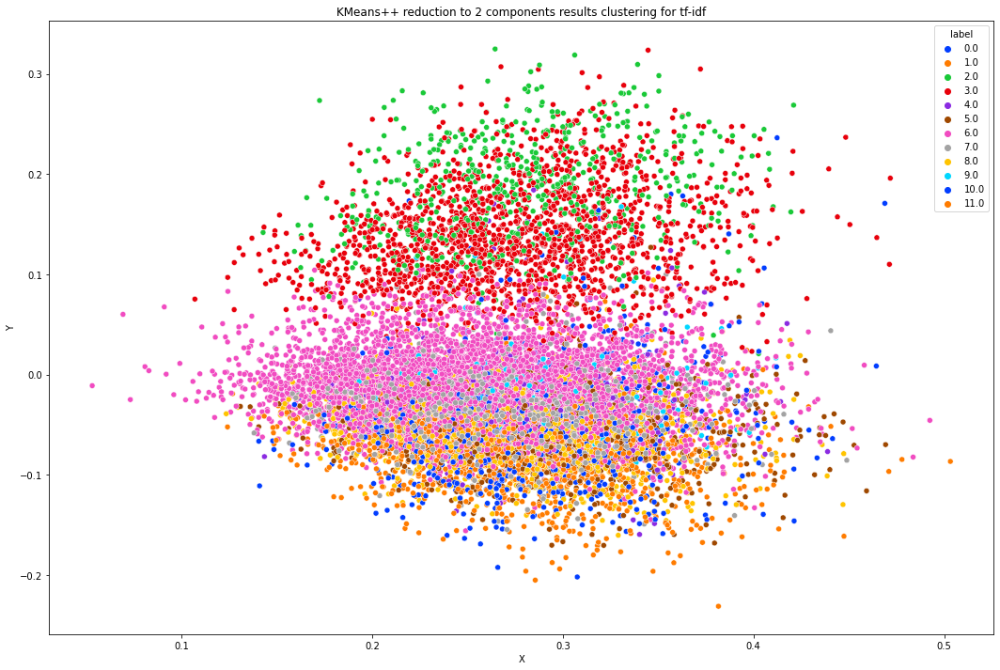

In [ ]:
show_data(X_2d_tf,predicted_label_kmeans_tf.reshape(-1,1),"KMeans++ reduction to 2 components results clustering for tf-idf")

{1: 1, 9: 2, 7: 4, 0: 3, 5: 1, 10: 2, 11: 1, 3: 1, 6: 1, 4: 1, 8: 2, 2: 2}


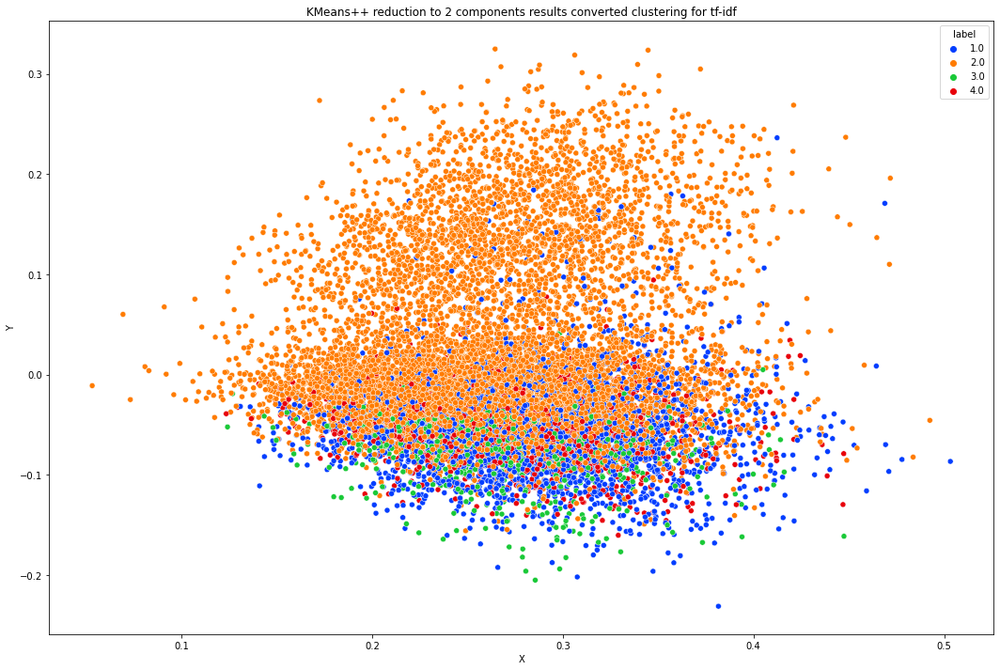

In [ ]:
print(kmeas_map_label)
show_data(X_2d_tf,np.array([kmeas_map_label_tf[i] for i in predicted_label_kmeans_tf]).reshape(-1,1),"KMeans++ reduction to 2 components results converted clustering for tf-idf")

{1: 1, 9: 2, 7: 4, 0: 3, 5: 1, 10: 2, 11: 1, 3: 1, 6: 1, 4: 1, 8: 2, 2: 2}


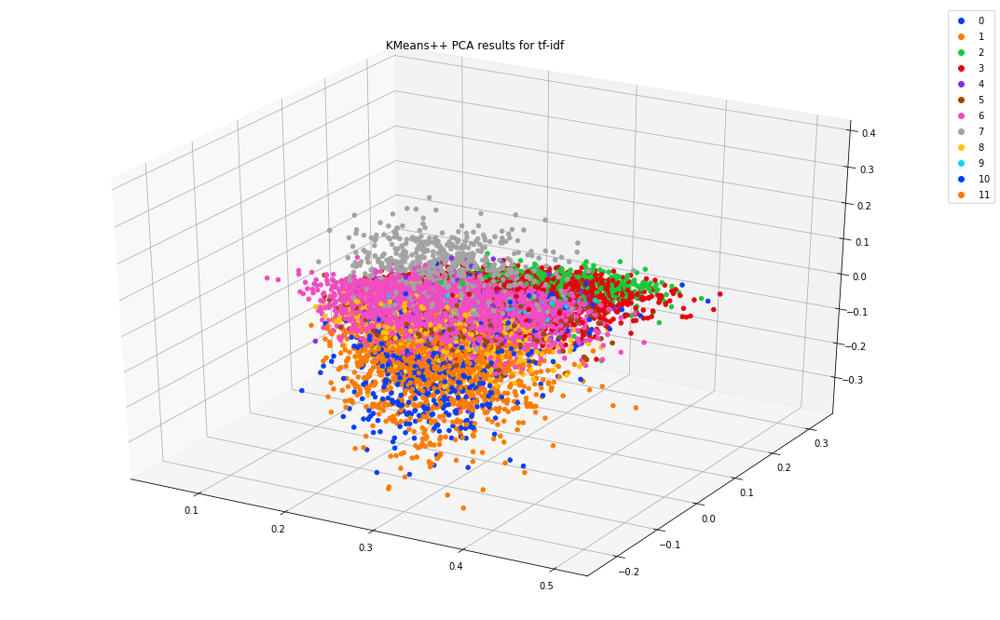

In [ ]:
print(kmeas_map_label)
show3D(X_3d_tf.T,predicted_label_kmeans_tf,"KMeans++ PCA results for tf-idf")

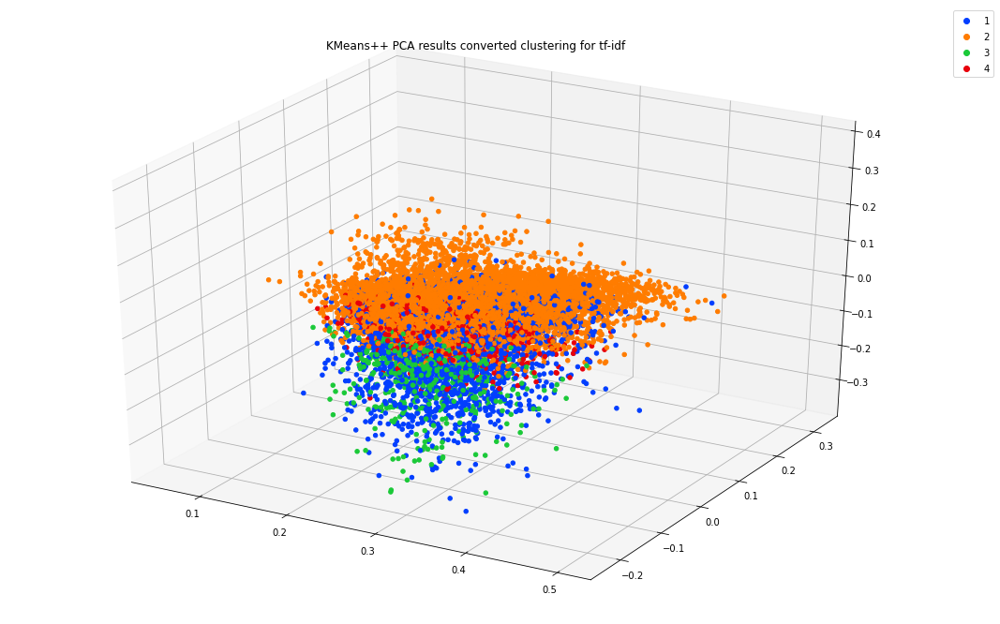

In [ ]:
show3D(X_3d_tf.T,[kmeas_map_label_tf[i] for i in predicted_label_kmeans_tf],"KMeans++ PCA results converted clustering for tf-idf ")

/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:200: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:201: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:203: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:204: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be remo

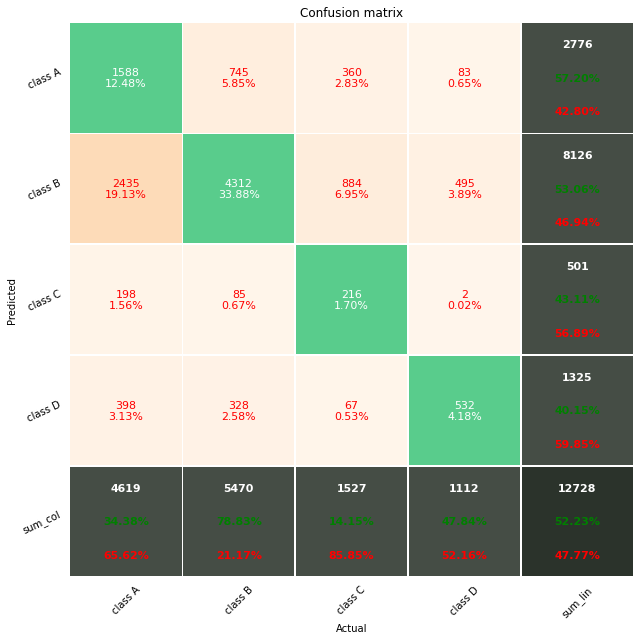

purity is : 0.5223130106851037

rand_score is : 0.5570618831658811



In [ ]:
from sklearn.metrics.cluster import rand_score
y_test = reduced_labeling
predic = np.array([kmeas_map_label_tf[i] for i in predicted_label_kmeans_tf])
matrix = pp_matrix_from_data(y_test, predic)
print(f"purity is : {np.sum(predic == y_test)/len(y_test)}")
print()
print(f"rand_score is : {rand_score(y_test,predic)}")
print()
centers = km_tf.cluster_centers_
# RSSs = np.array([np.sum(np.matmul(predicted_label_kmeans_tf == i ,(tf_idf_vec - centers[i])**2)) for i in range(len(centers))])
# RSSs_mean = np.array([np.sum(np.matmul(predicted_label_kmeans_tf == i ,(tf_idf_vec - centers[i])**2))/(predicted_label_kmeans_tf == i).sum() for i in range(len(centers))])
# print(f"RSS = {np.sum(RSSs)}")
# print(f"avg RSS = {np.sum(RSSs_mean)/len(RSSs_mean)}")
# print()
# print(f"silhouette_score = {silhouette_score(tf_idf_vec,predic)}")
# print()
# print(f"davies_bouldin_score = {davies_bouldin_score(tf_idf_vec,predic)}")
# print()
# print(f"calinski_harabasz_score = {calinski_harabasz_score(tf_idf_vec,predic)}")

+ note that tf-idf vectors are sparse object and could not use for other index.


## Kmeans results Compare between tf-idf and bert
in term of both purity rand_score bert embedding is working much better.

for other metrices because tf-idf was sparse matrix and converting to ndarray cuased system to go out of RAM we could not apply those on tf-idf and we only applied them on bert embeddings.

here are results:

RSS = 16031.30078125

avg RSS = 1.2470002844070536

silhouette_score = 0.026131602004170418

davies_bouldin_score = 4.314283390299819

calinski_harabasz_score = 332.5205184185859


## purity and rand score and avg RSS on varieties of K



In [ ]:
pu = []
ra = []
rss = []
silhouette = []

for k in range(int(N_COMPONENT/4),int(2*N_COMPONENT),2):
  print(k)
  km = KMeans(n_clusters= k, init='k-means++', n_init=10, max_iter=1000, tol=0.0001, verbose=0, random_state=None).fit(concated_data_bert)
  predicted_label_kmeans = km.predict(concated_data_bert)
  kmeas_map_label = find_mapping_for_cluster(predicted_label_kmeans)
  y_test = reduced_labeling
  predic = np.array([kmeas_map_label[i] for i in predicted_label_kmeans])
  pu.append(np.sum(predic == y_test)/len(y_test))
  ra.append(rand_score(y_test,predic))
  centers = km.cluster_centers_
  RSSs = np.array([np.sum(np.matmul(predicted_label_kmeans == i ,(concated_data_bert - centers[i])**2)) for i in range(len(centers))])
  RSSs_mean = np.array([np.sum(np.matmul(predicted_label_kmeans == i ,(concated_data_bert - centers[i])**2))/(predicted_label_kmeans == i).sum() for i in range(len(centers))])
  rss.append(np.sum(RSSs_mean)/len(RSSs_mean))
  silhouette.append(silhouette_score(concated_data_bert,predic))

3
5
7
9
11
13
15
17
19
21
23


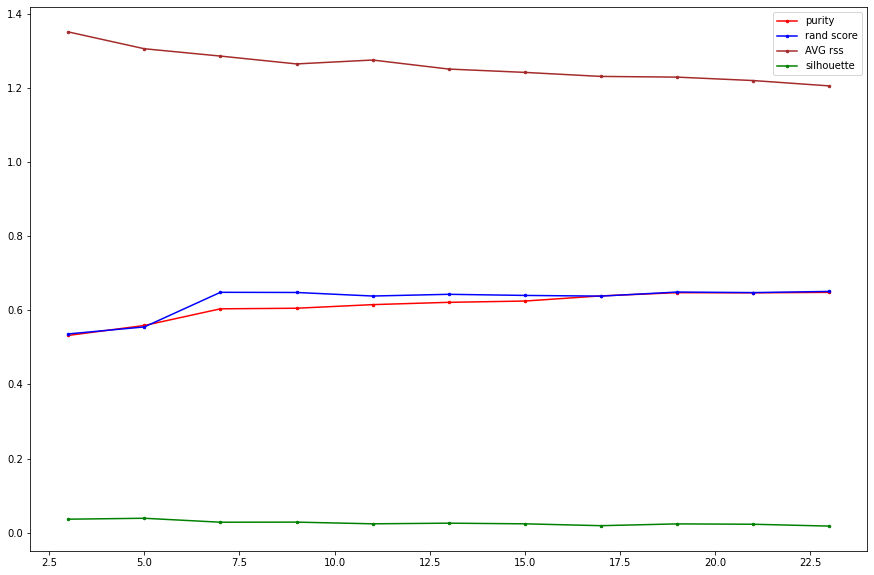

In [ ]:
fig = plt.figure( figsize = ( 15, 10))
X_d = range(int(N_COMPONENT/4),int(2*N_COMPONENT),2)
plt.plot( X_d ,pu, color = "red", label="purity" , marker = ".", markersize = 5)
plt.plot( X_d ,ra, color = "blue", label="rand score" , marker = ".", markersize = 5)
plt.plot( X_d ,rss, color = "brown", label="AVG rss" , marker = ".", markersize = 5)
plt.plot( X_d ,silhouette, color = "green", label="silhouette" , marker = ".", markersize = 5)
plt.legend()
plt.show()

you can see that number of clusters from 3 to 24 which is 2 times more than number of classed does not change the scores above which means that this number of cluster are fine.
at 8 purity and rand score improved and from then they are pretty same. 

rss decreases over k which is as expected.

# GMM

GMM models are probabilistic approach for clustring  
we said that we assume that probabilistic approach does not work better because TSNE method did  not did as goog as LDA or PCA so here are results.

+ note that we did not apply this in tf-idf because it was sparse matrix and sklearn GMM does not work spare numpy object 

In [ ]:
gm = GaussianMixture(n_components=N_COMPONENT, random_state=0).fit(concated_data_bert)
predicted_label_gmm = gm.predict(concated_data_bert)
gm_map_label = find_mapping_for_cluster(predicted_label_gmm)

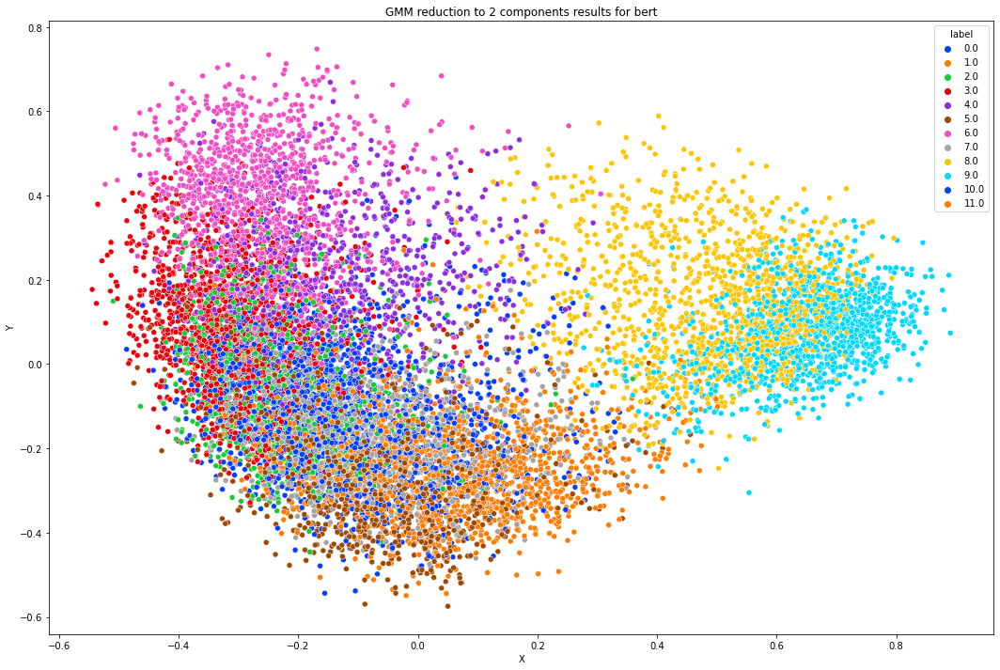

In [ ]:
show_data(X_2d_bert,predicted_label_gmm.reshape(-1,1),"GMM reduction to 2 components results for bert")


{7: 1, 5: 2, 0: 4, 6: 3, 10: 1, 11: 2, 2: 1, 3: 1, 1: 1, 4: 1, 8: 2, 9: 2}


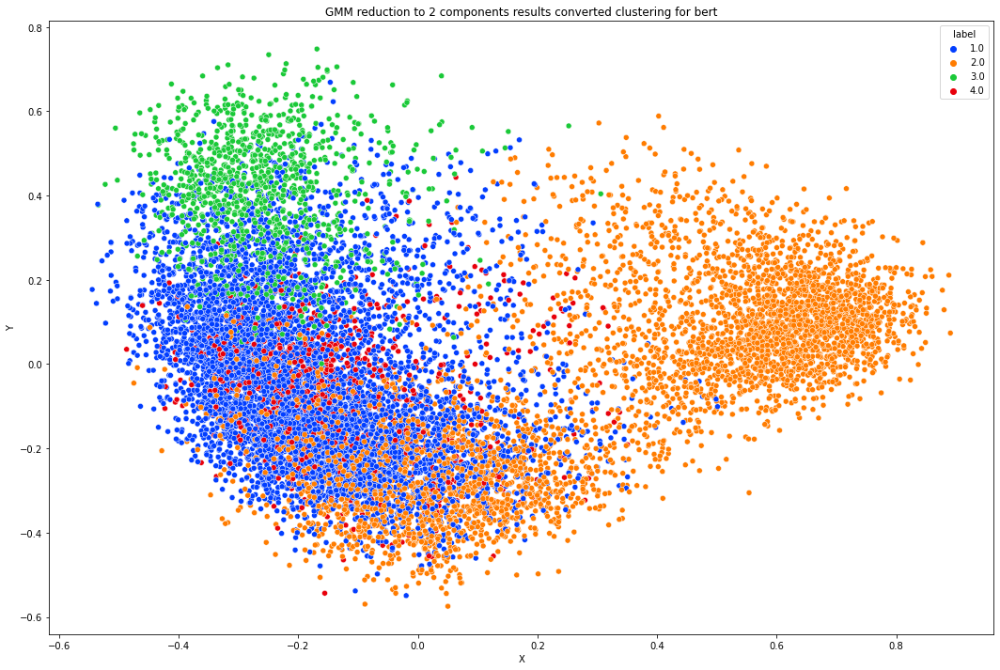

In [ ]:
print(gm_map_label)
show_data(X_2d_bert,np.array([gm_map_label[i] for i in predicted_label_gmm]).reshape(-1,1),"GMM reduction to 2 components results converted clustering for bert")

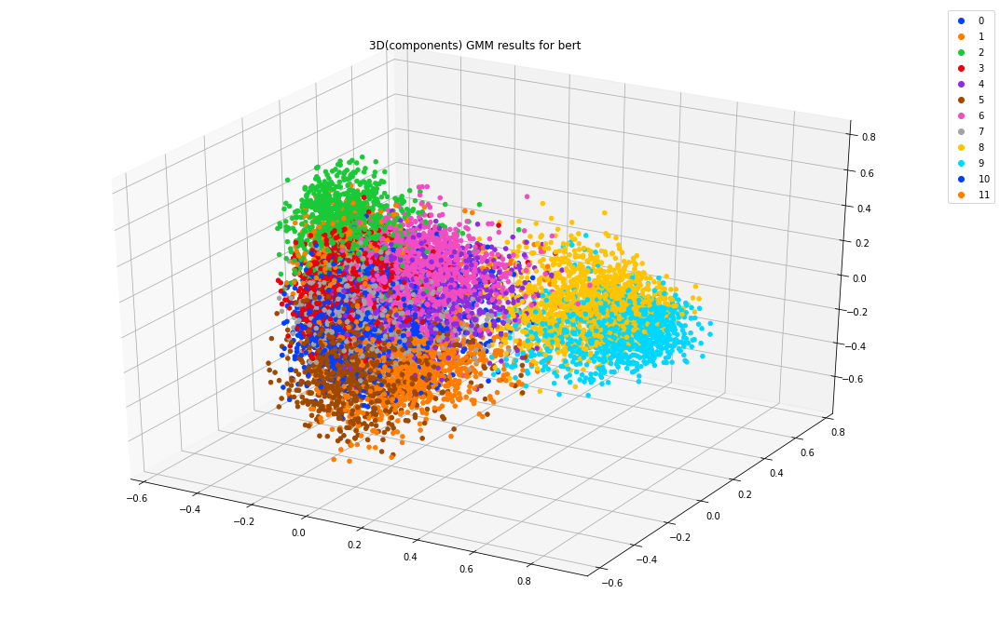

In [ ]:
show3D(X_3d_bert.T,predicted_label_gmm,"3D(components) GMM results for bert")

{7: 1, 5: 2, 0: 4, 6: 3, 10: 1, 11: 2, 2: 1, 3: 1, 1: 1, 4: 1, 8: 2, 9: 2}


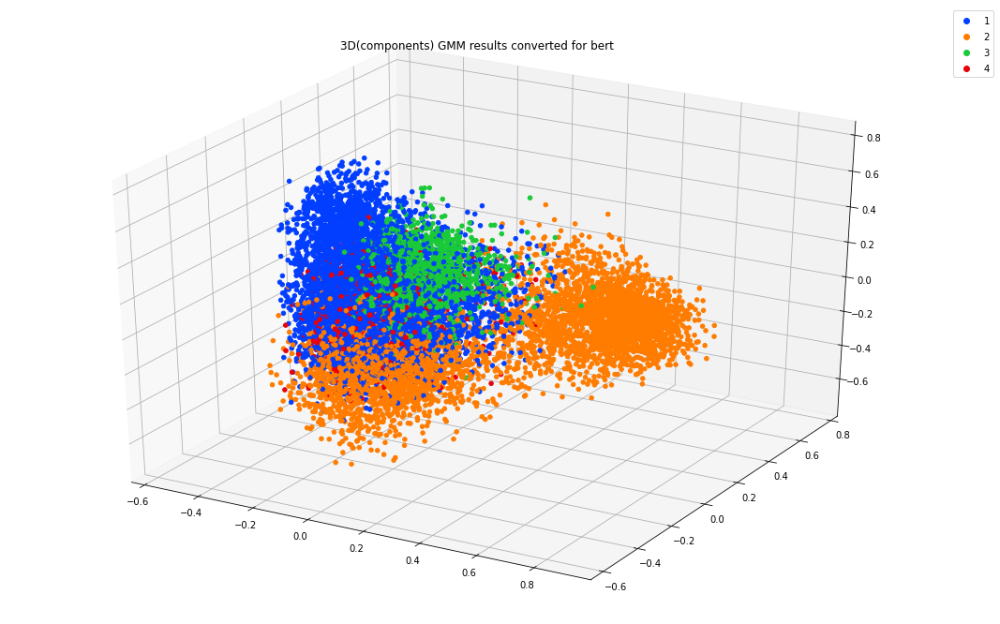

In [ ]:
print(gm_map_label)
show3D(X_3d_bert.T,[gm_map_label[i] for i in predicted_label_gmm],"3D(components) GMM results converted for bert")

/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:200: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:201: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:203: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:204: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be remo

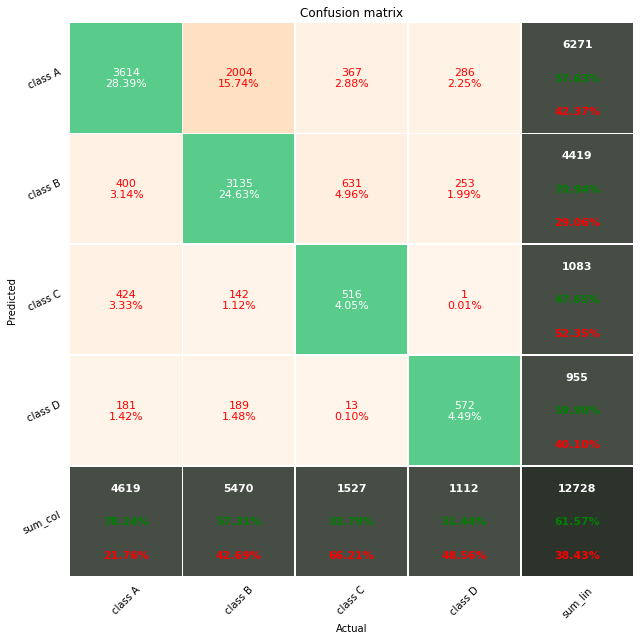

purity is : 0.6157291011942174

rand_score is : 0.6385537939627305

RSS = 16031.28708626549
avg RSS = 1.2471996414652322

silhouette_score = 0.026020724326372147

davies_bouldin_score = 4.312241018792851

calinski_harabasz_score = 332.3841214273527


In [ ]:
y_test = reduced_labeling
predic = np.array([gm_map_label[i] for i in predicted_label_gmm])
pp_matrix_from_data(y_test, predic)
print(f"purity is : {np.sum(predic == y_test)/len(y_test)}")
print()
print(f"rand_score is : {rand_score(y_test,predic)}")
print()
centers = gm.means_
RSSs = np.array([np.sum(np.matmul(predicted_label_gmm == i ,(concated_data_bert - centers[i])**2)) for i in range(len(centers))])
RSSs_mean = np.array([np.sum(np.matmul(predicted_label_gmm == i ,(concated_data_bert - centers[i])**2))/(predicted_label_gmm == i).sum() for i in range(len(centers))])
print(f"RSS = {np.sum(RSSs)}")
print(f"avg RSS = {np.sum(RSSs_mean)/len(RSSs_mean)}")
print()
print(f"silhouette_score = {silhouette_score(concated_data_bert,predic)}")
print()
print(f"davies_bouldin_score = {davies_bouldin_score(concated_data_bert,predic)}")
print()
print(f"calinski_harabasz_score = {calinski_harabasz_score(concated_data_bert,predic)}")

# LDA and Kmeans

In [ ]:
clf = LinearDiscriminantAnalysis(n_components=len(Counter(reduced_labeling))-1)
clf.fit(concated_data_bert,reduced_labeling)
X_lda = clf.transform(concated_data_bert)
kmlda = KMeans(n_clusters= N_COMPONENT, init='k-means++', n_init=10, max_iter=1000, tol=0.0001, verbose=0, random_state=None).fit(X_lda)
predicted_label_kmeanslda = kmlda.predict(X_lda)
kmeas_map_labellda = find_mapping_for_cluster(predicted_label_kmeanslda)

## LDA labels

this is labels that predicted by LDA 
you can see that LDA is pretty good at classification we use this reduction which is 3d and use this reduced vectors for kmeans that means that 768 dimention is reduced to 3 and then kmeans deals with 3 dimentions vectors 

/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:200: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:201: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:203: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:204: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be remo

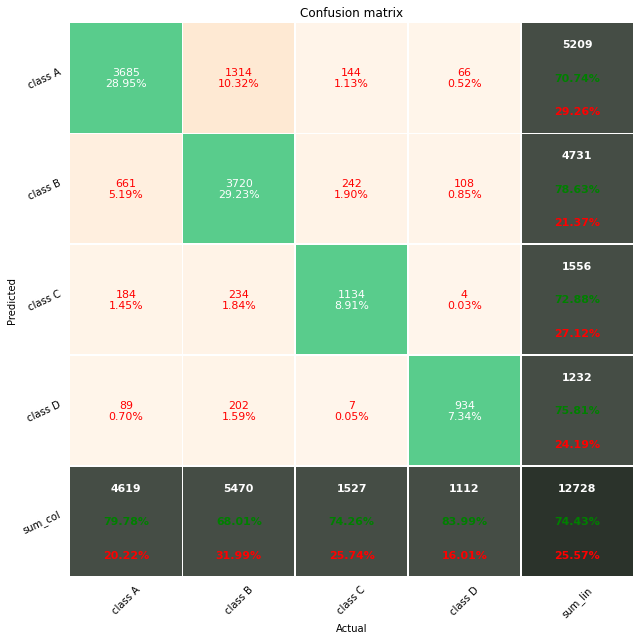

In [ ]:
l = clf.predict(concated_data_bert)
map_labellda = find_mapping_for_cluster(l)
y_test = reduced_labeling
predic = np.array([map_labellda[i] for i in l])
pp_matrix_from_data(y_test, predic)

## LDA reduced vectors used for kmeans

/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:200: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:201: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:203: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/usr/local/lib/python3.7/dist-packages/pretty_confusion_matrix/pretty_confusion_matrix.py:204: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be remo

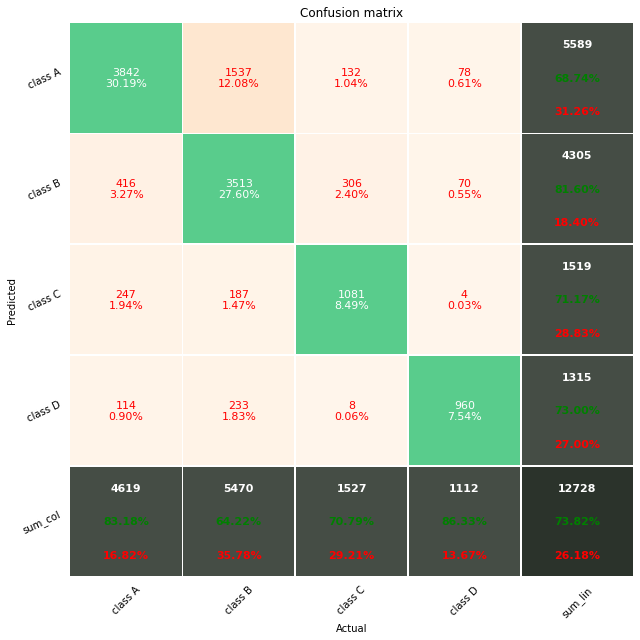

purity is : 0.7382149591451918

rand_score is : 0.7246443677721441

RSS = 11015.368689972229
avg RSS = 0.9703060278588079

silhouette_score = 0.3991942053975873

davies_bouldin_score = 0.8406738263667916

calinski_harabasz_score = 9419.722250885341


In [ ]:
y_test = reduced_labeling
predic = np.array([kmeas_map_labellda[i] for i in predicted_label_kmeanslda])
pp_matrix_from_data(y_test, predic)
print(f"purity is : {np.sum(predic == y_test)/len(y_test)}")
print()
print(f"rand_score is : {rand_score(y_test,predic)}")
print()
centers = kmlda.cluster_centers_
RSSs = np.array([np.sum(np.matmul(predicted_label_kmeanslda == i ,(X_lda - centers[i])**2)) for i in range(len(centers))])
RSSs_mean = np.array([np.sum(np.matmul(predicted_label_kmeanslda == i ,(X_lda - centers[i])**2))/(predicted_label_kmeanslda == i).sum() for i in range(len(centers))])
print(f"RSS = {np.sum(RSSs)}")
print(f"avg RSS = {np.sum(RSSs_mean)/len(RSSs_mean)}")
print()
print(f"silhouette_score = {silhouette_score(X_lda,predic)}")
print()
print(f"davies_bouldin_score = {davies_bouldin_score(X_lda,predic)}")
print()
print(f"calinski_harabasz_score = {calinski_harabasz_score(X_lda,predic)}")

you can see significant improvment in clustring evaluation metrices

this is awesome how LDA improved clustring when you think that only 3d were used.

this is due to that LDA uses labels for reduction.